The code is very similar to the calculations of the ICON columns.
The main differences are:

- Data of camchem is located on half levels instead of full levels, which leads to some small differences in the code

- Tempv cannot be calculated since there is no mixing ratio data available, but this should matter very little
- NO2 concentrations are calculated using pressure and temperature instead of air density (line 359+490)
- Depth of the layers is calculated using pressure and temperature (line 483) instead of using the height directly, which was done for the ICON ds


In [1]:
%load_ext autoreload
%autoreload 2

import xarray as xr
import numpy as np
import pandas as pd

from matplotlib.collections import PolyCollection 
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt 
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import glob

import sys
import os
# sys.path.insert(1, '/interpolation_area')
# from src_NO2_camchem_TROPOMI_comp import find_closest_full_hour_TROPOMI, camchem_to_TROPOMI, recalc_AMF, TROPOMI_to_camchem, plot_TROPOMI_map, calc_camchem_col, plot_camchem_map
from src_NO2_camchem_TROPOMI_comp_AMF_corr import find_closest_full_hour_TROPOMI, camchem_to_TROPOMI, recalc_AMF, TROPOMI_to_camchem, plot_TROPOMI_map, calc_camchem_col, plot_camchem_map



# sys.path.append('/scratch/snx3000/amols/ddeq/src')
# import ddeq


In [2]:
# Define domain
min_lon, max_lon, min_lat, max_lat = -13, 28, 32, 68

# Define the output path
output_path = './column_comp_results_camchem/'

# Subdirectory names
subdirectories = ['reduced_camchem', 'camchem_on_TROPOMI', 'recalc_TROPOMI_AMF',
                  'TROPOMI_on_camchem', 'final_merged_result', 'figs']

# Create subdirectories if they don't exist
for subdirectory in subdirectories:
    os.makedirs(os.path.join(output_path, subdirectory), exist_ok=True)


In [3]:
### Compare the camchem and TROPOMI columns in 4 steps

def compare_camchem_TROPOMI(ICON_file, camchem_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat):

    ### 1. Remap camchem to TROPOMI
    camchem_to_TROPOMI(ICON_file, camchem_file, TROPOMI_file, output_path, date, overpass_nr)

    #### 2. Recalculate AMF + TROPOMI NO2 columns
    recalc_AMF(TROPOMI_file, output_path, overpass_nr, date, min_lon, max_lon, min_lat, max_lat)

    ### 3. Remap TROPOMI to camchem grid
    TROPOMI_to_camchem(camchem_file, output_path, date, overpass_nr)

    ### 4. Calculate camchem NO2 columns
    calc_camchem_col(output_path, overpass_nr, date)

#### 1. Compare the NO2 columns for one date

In [4]:
# Date can range from 12-25 July/February 2019
overpass_nr = 0
date = '20190213'

# Files
TROPOMI_file = glob.glob(f"/scratch/snx3000/amols/data/S5P_raw/S5P_RPRO_L2__NO2____{date}*")[overpass_nr]

hour = find_closest_full_hour_TROPOMI(TROPOMI_file)

ICON_file = f'/scratch/snx3000/amols/data/nudged_ICON_data/icon-art-full-chem_EU_LBC_{date}T{hour}0000Z.nc'
camchem_file = f'/scratch/snx3000/amols/data/camchem_data/camchem_hourly/camchem_{date}{hour}_icon.nc'


In [6]:
# Perform calculation for one date
compare_camchem_TROPOMI(ICON_file, camchem_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat)

/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

#### 2. Compare the NO2 columns for multiple dates

20190720
11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190720 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190720 and overpass number 2. Skipping...
20190721
11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

13


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190721 and overpass number 2. Skipping...
20190722
11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190722 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190722 and overpass number 2. Skipping...
20190723
12


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190723 and overpass number 2. Skipping...
20190724
No TROPOMI files found for date 20190724. Skipping...
20190725
12


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190725 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190725 and overpass number 2. Skipping...
20190726
13


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190726 and overpass number 2. Skipping...
20190727
11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

13


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190727 and overpass number 2. Skipping...
20190728
11


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

12


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190728 and overpass number 2. Skipping...
20190729
10


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

12


/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:172: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ny = self.data.dims["nrows"]
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_camchem_TROPOMI_comp_AMF_corr.py:173: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  nx = self.data.dims["nobs"]
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo(1) select: Process started
Wa

TROPOMI file does not exist for date 20190729 and overpass number 2. Skipping...
20190730
12


FileNotFoundError: [Errno 2] No such file or directory: '/scratch/snx3000/amols/data/camchem_data/camchem_hourly/camchem_2019073012_icon.nc'

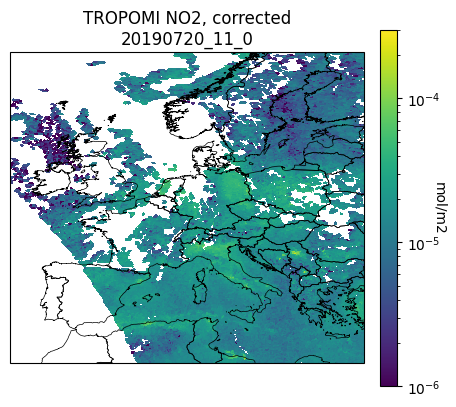

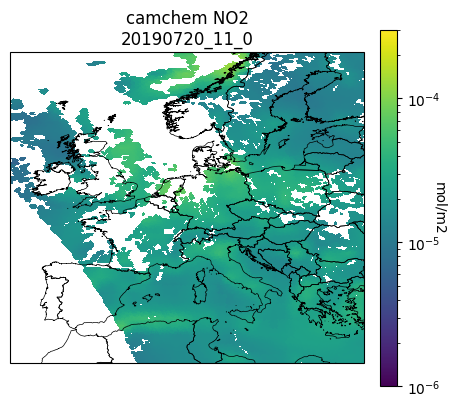

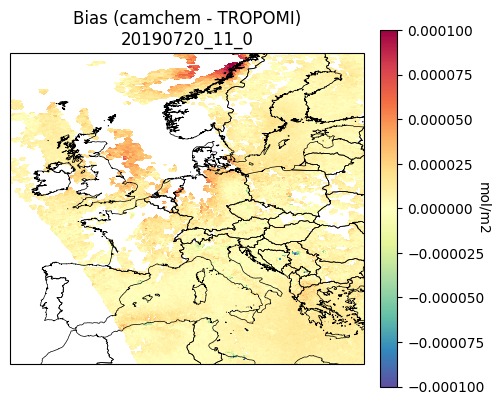

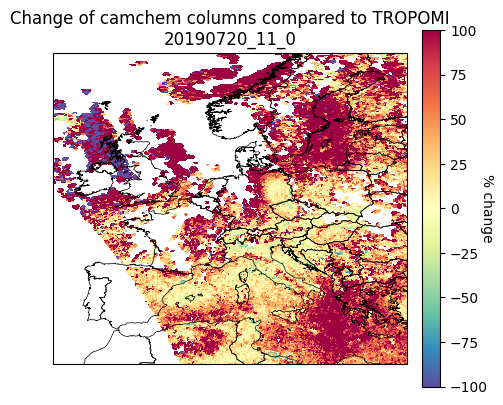

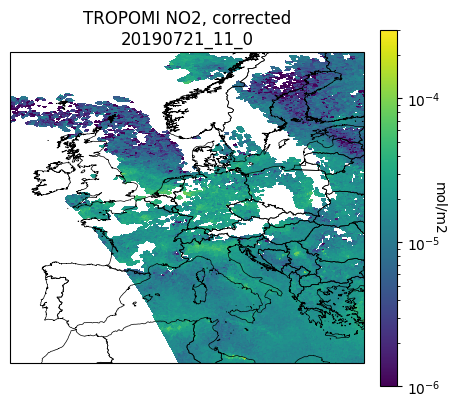

...

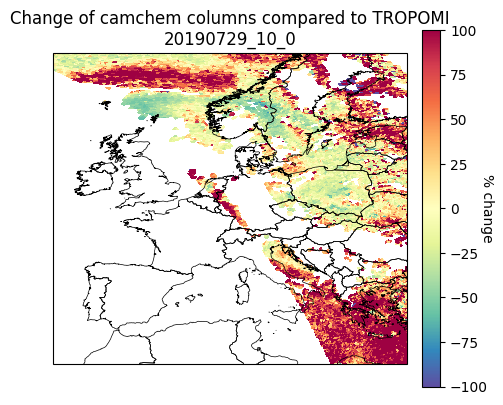

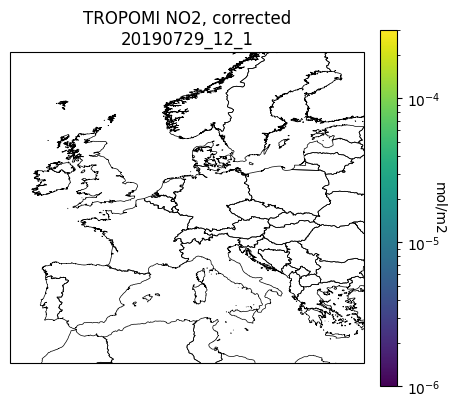

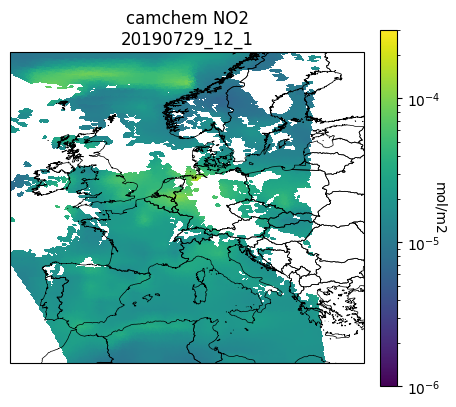

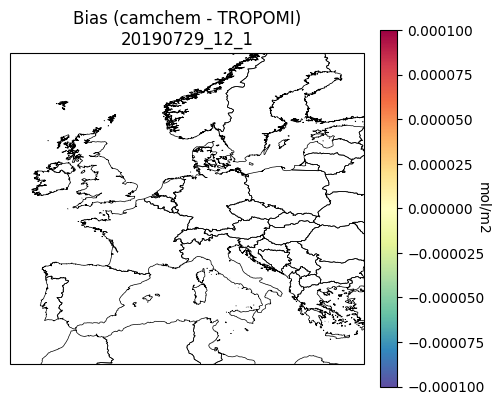

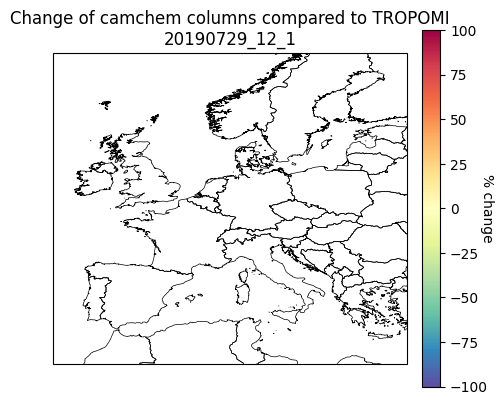

In [6]:
# Define domain
min_lon, max_lon, min_lat, max_lat = -13, 28, 32, 68

# dates_feb = np.arange(20190212, 20190229)
# dates_mar = np.arange(20190304, 20190313)
dates_jul = np.arange(20190720, 20190731)
# dates_aug = np.arange(20190801, 20190813)
# dates = np.concatenate((dates_jul, dates_aug))
overpass_nrs = np.arange(0,3)

for date in dates_jul:
    
    print(date)

    # Check if there are any TROPOMI files for the date
    TROPOMI_files = glob.glob(f"/scratch/snx3000/amols/data/S5P_raw/S5P_RPRO_L2__NO2____{date}*")
    if not TROPOMI_files:  # If the list is empty
        print(f"No TROPOMI files found for date {date}. Skipping...")
        continue

    for overpass_nr in overpass_nrs:
        # Since we know there's at least one TROPOMI file for this date, we check the specific overpass
        try:
            TROPOMI_file = TROPOMI_files[overpass_nr]
        except IndexError:
            # This overpass number does not exist for the date
            print(f"TROPOMI file does not exist for date {date} and overpass number {overpass_nr}. Skipping...")
            continue
        
        hour = find_closest_full_hour_TROPOMI(TROPOMI_file)
        print(hour)
        # Files
        ICON_file = f'/scratch/snx3000/amols/data/nudged_ICON_data/icon-art-full-chem_EU_LBC_{date}T{hour}0000Z.nc'
        camchem_file = f'/scratch/snx3000/amols/data/camchem_data/camchem_hourly/camchem_{date}{hour}_icon.nc'

        compare_camchem_TROPOMI(ICON_file, camchem_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat)

        # Plot
        combined_ds =  xr.open_dataset(f"{output_path}final_merged_result/column_comp_{date}_{overpass_nr}.nc")

        var = combined_ds.NO2_recalc.values
        plot_camchem_map(combined_ds, var, 1e-6, 3e-4, f'TROPOMI NO2, corrected\n{date}_{hour}_{overpass_nr}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'TROPOMI_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = combined_ds.NO2_camchem[:,0].values
        plot_camchem_map(combined_ds, var, 1e-6, 3e-4, f'camchem NO2\n{date}_{hour}_{overpass_nr}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'camchem_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = combined_ds.NO2_camchem[:,0].values-combined_ds.NO2_recalc.values
        plot_camchem_map(combined_ds, var, -1e-4, 1e-4, f'Bias (camchem - TROPOMI)\n{date}_{hour}_{overpass_nr}', 'mol/m2', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'bias_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = (combined_ds.NO2_camchem[:,0].values-(combined_ds.NO2_recalc.values))/combined_ds.NO2_recalc.values*100
        plot_camchem_map(combined_ds, var, -100, 100, f'Change of camchem columns compared to TROPOMI\n{date}_{hour}_{overpass_nr}', '% change', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'change_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)


In [16]:
ds_camchem = xr.open_dataset('/scratch/snx3000/amols/data/camchem_data/camchem_hourly/camchem_2019072011_icon.nc')

In [17]:
ds_camchem

<xarray.Dataset> Size: 775MB
Dimensions:    (ncells: 90268, lev: 56, time: 1, vertices: 3, bnds: 2)
Coordinates:
    clat       (ncells) float64 722kB ...
    clon       (ncells) float64 722kB ...
  * lev        (lev) float64 448B 1.868 2.353 2.948 3.677 ... 962.5 977.5 992.5
  * time       (time) int64 8B 11
Dimensions without coordinates: ncells, vertices, bnds
Data variables: (12/25)
    ALKNIT     (lev, ncells) float64 40MB ...
    HNO3       (lev, ncells) float64 40MB ...
    HO2NO2     (lev, ncells) float64 40MB ...
    HONITR     (lev, ncells) float64 40MB ...
    ISOPNITA   (lev, ncells) float64 40MB ...
    ISOPNITB   (lev, ncells) float64 40MB ...
    ...         ...
    Z3         (time, lev, ncells) float64 40MB ...
    clat_bnds  (ncells, vertices) float64 2MB ...
    clon_bnds  (ncells, vertices) float64 2MB ...
    date       float64 8B ...
    datesec    float64 8B ...
    lev_bnds   (lev, bnds) float64 896B ...

#### 3. Plot results


In [8]:
# Open data to plot

overpass_nr = 0
date = 20190213

data_S5p_recalc_AMF = xr.open_dataset(f"{output_path}recalc_TROPOMI_AMF/recalc_AMF_{date}_{overpass_nr}.nc")
combined_ds =  xr.open_dataset(f"{output_path}final_merged_result/column_comp_{date}_{overpass_nr}.nc")


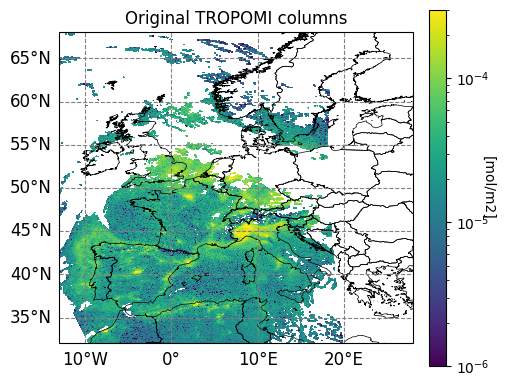

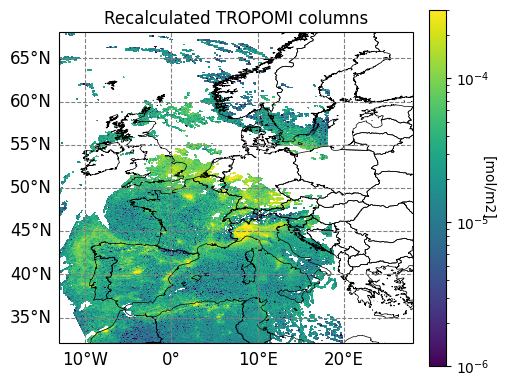

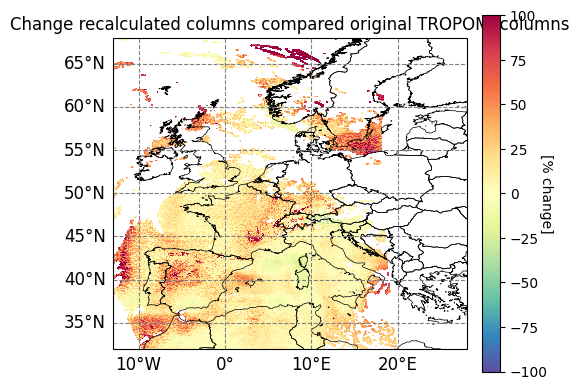

In [9]:
var_TROPOMI = data_S5p_recalc_AMF.nitrogendioxide_tropospheric_column[0,:,:].values
plot_TROPOMI_map(data_S5p_recalc_AMF, var_TROPOMI, 1e-6, 3e-4, 'Original TROPOMI columns', '[mol/m2]', LogNorm())

var = data_S5p_recalc_AMF['NO2_recalc_camchem'][0,:,:].values
plot_TROPOMI_map(data_S5p_recalc_AMF,var, 1e-6, 3e-4, 'Recalculated TROPOMI columns', '[mol/m2]', LogNorm())

var = (data_S5p_recalc_AMF['NO2_recalc_camchem'][0,:,:].values - data_S5p_recalc_AMF['nitrogendioxide_tropospheric_column'][0,:,:].values) / data_S5p_recalc_AMF['nitrogendioxide_tropospheric_column'][0,:,:].values *100
plot_TROPOMI_map(data_S5p_recalc_AMF,var, -100, 100, 'Change recalculated columns compared original TROPOMI columns', '[% change]', None, colormap='Spectral_r')

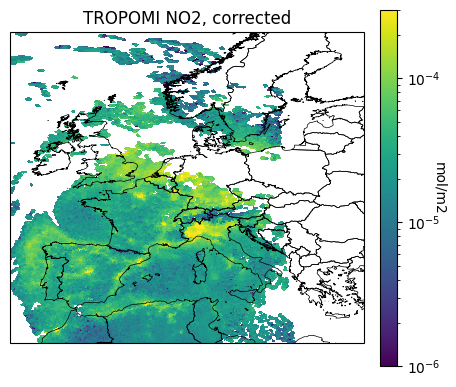

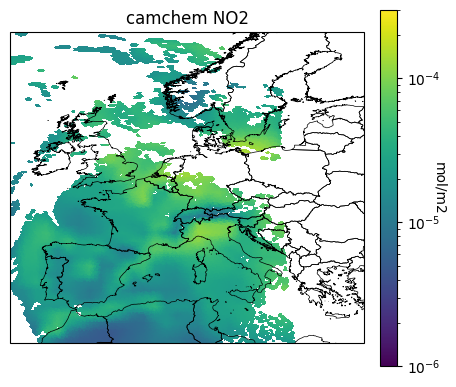

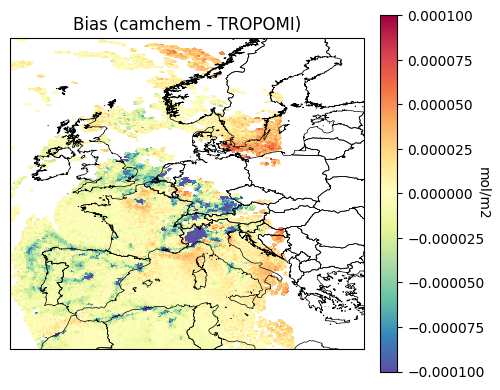

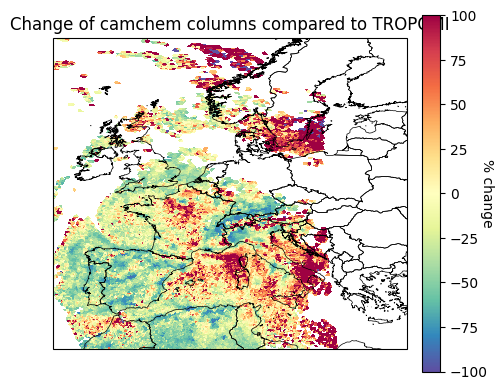

In [12]:
var = combined_ds.NO2_recalc.values
plot_camchem_map(combined_ds, var, 1e-6, 3e-4, 'TROPOMI NO2, corrected', 'mol/m2', scale=LogNorm, colormap='viridis')

var = combined_ds.NO2_camchem[:,0].values
plot_camchem_map(combined_ds, var, 1e-6, 3e-4, 'camchem NO2', 'mol/m2', scale=LogNorm, colormap='viridis')

var = combined_ds.NO2_camchem[:,0].values-combined_ds.NO2_recalc.values
plot_camchem_map(combined_ds, var, -1e-4, 1e-4, 'Bias (camchem - TROPOMI)', 'mol/m2', scale=Normalize, colormap='Spectral_r')

var = (combined_ds.NO2_camchem[:,0].values-(combined_ds.NO2_recalc.values))/combined_ds.NO2_recalc.values*100
plot_camchem_map(combined_ds, var, -100, 100, 'Change of camchem columns compared to TROPOMI', '% change', scale=Normalize, colormap='Spectral_r')

#### 4. Calculate statistics


In [34]:
## Calculate NMBE

def normalized_mean_bias_error(true, pred):
    nmbe_loss = np.nanmean(pred - true) / np.nanmean(true) * 100
    return nmbe_loss

true = combined_ds.NO2_recalc.values
pred = combined_ds.NO2_camchem[:,0].values

nmbe = normalized_mean_bias_error(true, pred)
nmbe

-30.308695833432388

#### 5. Plot vertical profiles

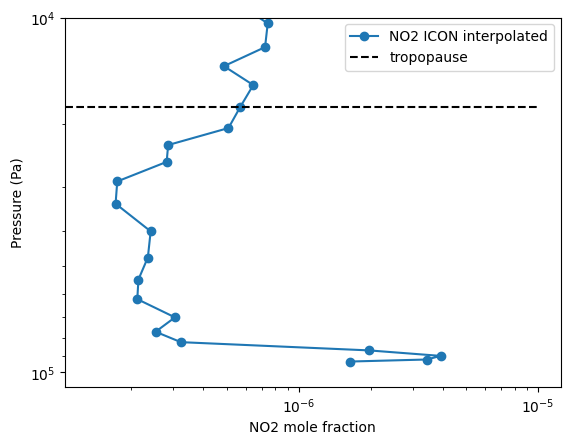

The original AMF is: 1.1026342269354943
The recalculated AMF is: 1.4536136


In [37]:

scanline_plot = 200
grnd_pix_plot = 300


#plt.plot(ICON_subset[:,scanline_plot,grnd_pix_plot], ICON_levels[:,scanline_plot,grnd_pix_plot], label='NO2 ICON', marker='o')
plt.plot(data_S5p_recalc_AMF.NO2_partial_col_stretched[:,scanline_plot,grnd_pix_plot], data_S5p_recalc_AMF.pressure_mid[:,scanline_plot,grnd_pix_plot], label='NO2 ICON interpolated', marker='o')
#plt.plot(data_S5p_cropped.NO2_profile[0,scanline_plot,grnd_pix_plot,:], data_S5p_cropped.mid_pressure_prior_NO2[0,scanline_plot,grnd_pix_plot,:], label='Prior TM5 NO2 profile', marker='o')
plt.hlines(y=data_S5p_recalc_AMF['pressure_tropopause_camchem'][scanline_plot,grnd_pix_plot], xmin=0, xmax=0.00001, color='black', linestyle='--', label='tropopause')
plt.xlabel('NO2 mole fraction')
plt.ylabel('Pressure (Pa)')
plt.yscale('log')
plt.xscale('log')
# plt.xlim(0,0.000000008)
plt.ylim(110000,10000)
plt.legend()
plt.show()

print('The original AMF is:',(data_S5p_recalc_AMF['AMF_recalc_camchem'][0,scanline_plot,grnd_pix_plot]).values)
print('The recalculated AMF is:',(data_S5p_recalc_AMF['air_mass_factor_troposphere'][0,scanline_plot,grnd_pix_plot]).values)

